In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Rectangle, Polygon
import os
import numpy as np
import pandas as pd
import matplotlib
from math import sqrt

In [12]:
def display_image(file_name, directory_path, directory_path_labels=None, save_path=None, sentinel=False, obb=False):
    img_path = os.path.join(directory_path, file_name)
    img = mpimg.imread(img_path)
    fig, ax = plt.subplots(figsize=(6, 6))
    
    if directory_path_labels:
        # labels.txt can have multiple lines, each line is a bounding box
        label_path = os.path.join(directory_path_labels, file_name[:-4] + '.txt')
        with open(label_path, 'r') as file:
            lines = file.readlines()

        for line in lines:
            cor = np.fromstring(line, sep=' ')
            if not obb:
                rect_x = cor[1] * img.shape[1]
                rect_y = cor[2] * img.shape[0]
                width = cor[3] * img.shape[1]
                height = cor[4] * img.shape[0]

                top_left_x = rect_x - width / 2
                top_left_y = rect_y - height / 2
                rect = Rectangle((top_left_x, top_left_y), width, height, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                # ax.scatter([rect_x], [rect_y], c='r')  # Red dot at the center
            else:
                # Extract corner coordinates
                corners = cor[1:].reshape(4, 2)
                corners[:, 0] *= img.shape[1]
                corners[:, 1] *= img.shape[0]

                # Create a polygon for the OBB
                polygon = Polygon(corners, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(polygon)
        
    ax.axis('off')
    ax.imshow(img)
    # format_axes(ax)
    if save_path:
        if sentinel==False:
            if directory_path_labels:
                if obb:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_obb.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300) 
                else:   
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_box.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300)
            else:
                combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}.pdf')
                plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300)
        else:
            if directory_path_labels:  
                if obb:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen_obb.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300)  
                else:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen_box.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300)
            else:
                combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen.pdf')
                plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', dpi=300)

    plt.show()
    plt.close(fig)


In [13]:
# directory_path = '/home/patel_zeel/kilns_neurips24/processed_data/lucknow_sarath_grid_aa_v3/images'
# directory_path_labels = '/home/patel_zeel/kilns_neurips24/processed_data/lucknow_sarath_grid_aa_v3/labels'

# directory_path_sentinel = '/home/rishabh.mondal/data_download_experiments/sentinel_data/processed_data/lucknow_sarath_grid_aa_v3/images'

directory_path_obb = '/home/patel_zeel/kilns_neurips24/crossval/lucknow_sarath_grid_obb_v3/0/train/images'
directory_path_labels_obb = '/home/patel_zeel/kilns_neurips24/crossval/lucknow_sarath_grid_obb_v3/0/train/labels'

directory_path_sentinel_obb = '/home/rishabh.mondal/Brick-Kilns-project/albk_rishabh/albk_v2/YOLO_LOCALIZATION/super_res_exp/Time-Series-Super-Resolution/crossval_sr/lucknow_sarath_grid_obb_v3/0/train/images'

# save_path = '/home/rishabh.mondal/data_download_experiments/sentinel_data_exp/yolo_sentinel_lucknow_exp/saved_images'

all_files = os.listdir(directory_path_obb)
# Filter out files to include only images (assuming JPEG and PNG files)
image_files = [file for file in all_files if file.endswith('.jpg') or file.endswith('.png')]

# Get only the first 10 images
first_ten_images = image_files[:10]
first_ten_images

['26.85,81.23.png',
 '26.88,81.23.png',
 '26.97,80.90.png',
 '26.95,81.05.png',
 '26.69,80.84.png',
 '26.90,81.20.png',
 '26.76,81.24.png',
 '26.76,81.22.png',
 '26.76,81.23.png',
 '27.10,81.19.png']

26.85,81.23.png


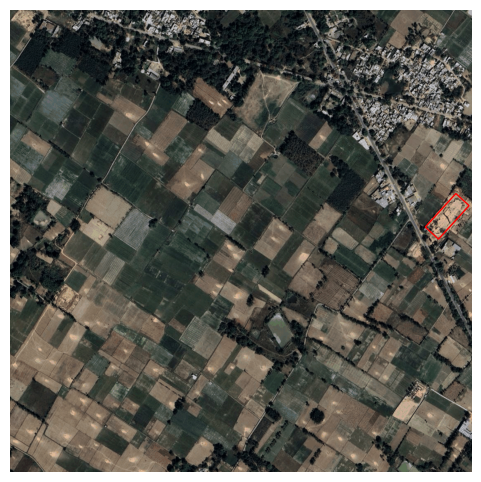

26.88,81.23.png


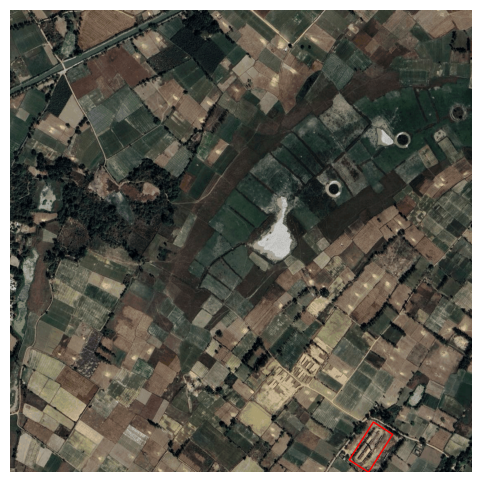

26.97,80.90.png


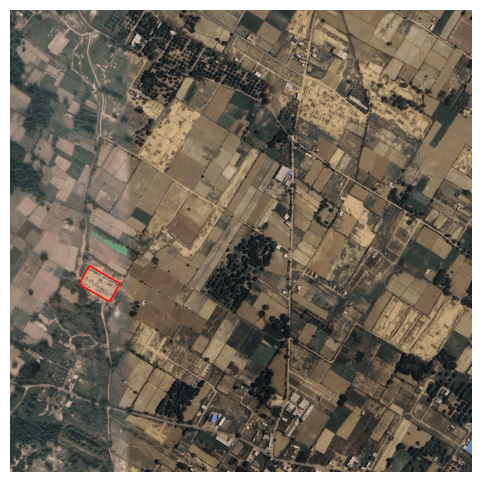

26.95,81.05.png


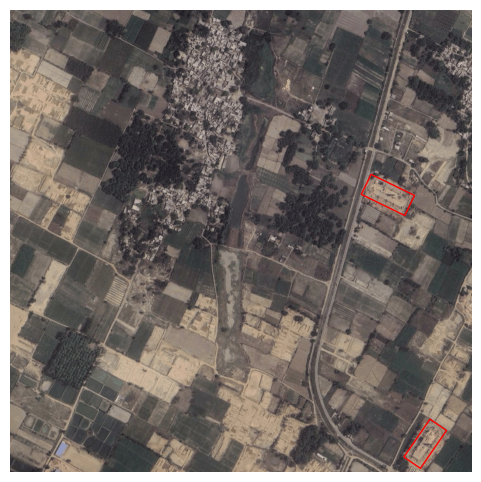

26.69,80.84.png


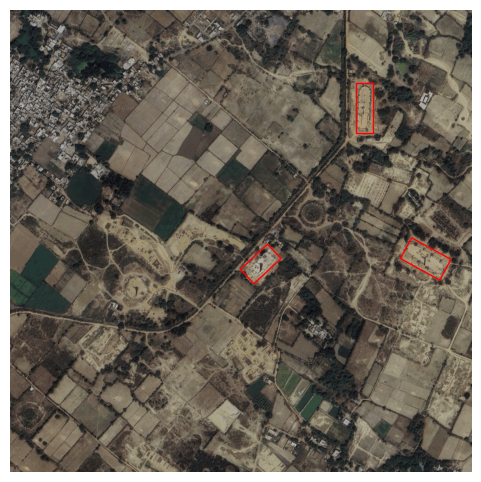

26.90,81.20.png


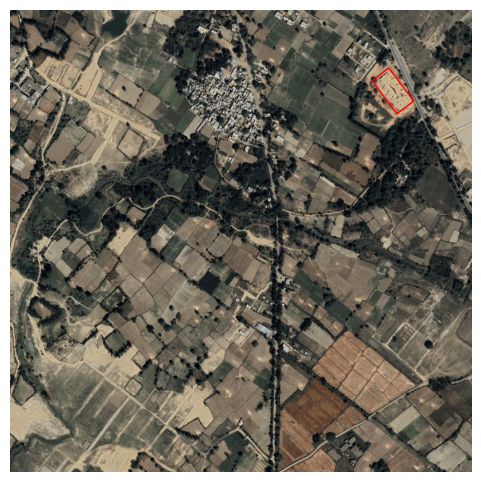

26.76,81.24.png


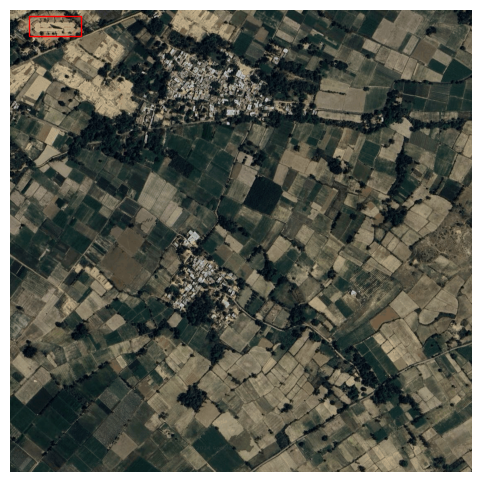

26.76,81.22.png


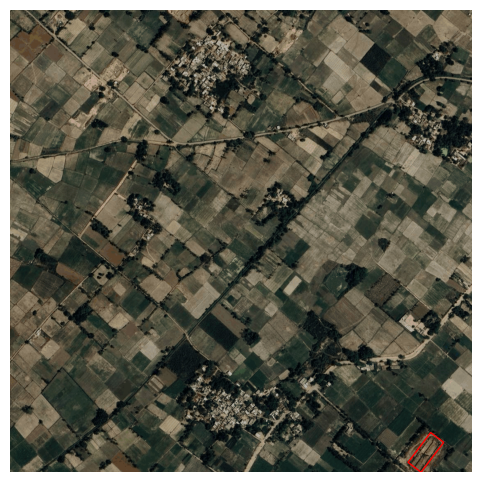

26.76,81.23.png


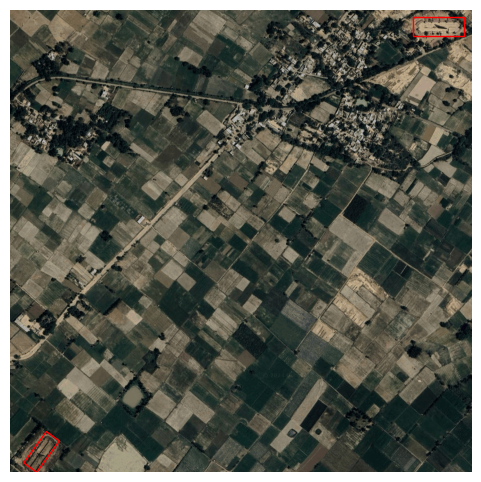

27.10,81.19.png


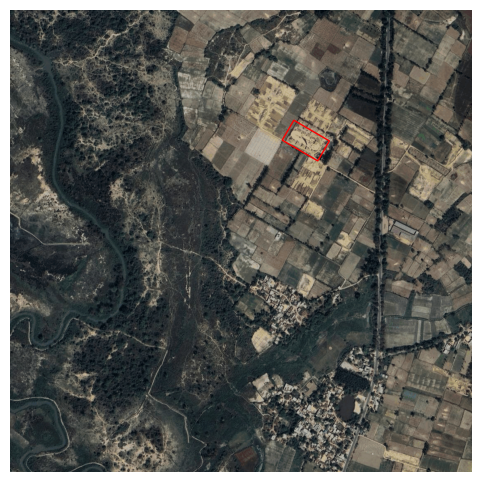

In [15]:
for file_name in first_ten_images:
    print(file_name)
    display_image(file_name, directory_path_obb, directory_path_labels_obb, save_path=None,sentinel=False, obb=True)

26.85,81.23.png


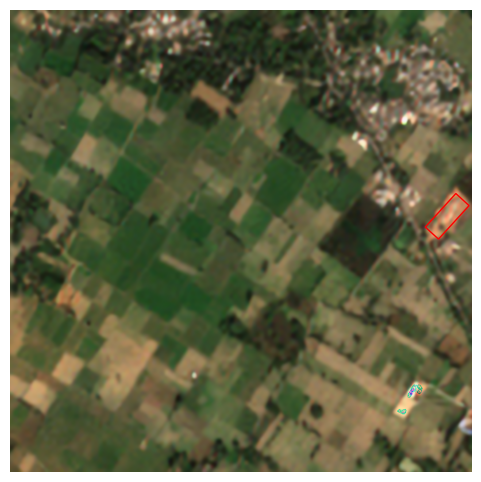

26.88,81.23.png


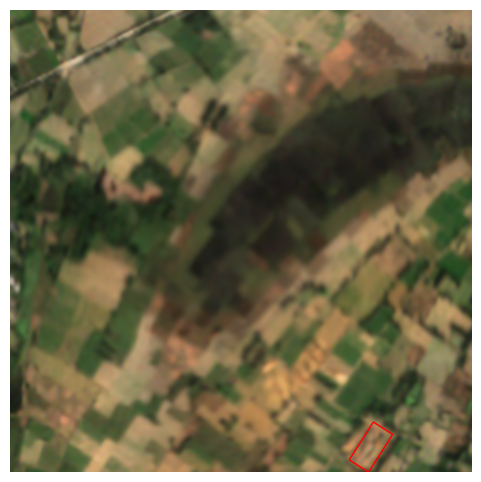

26.97,80.90.png


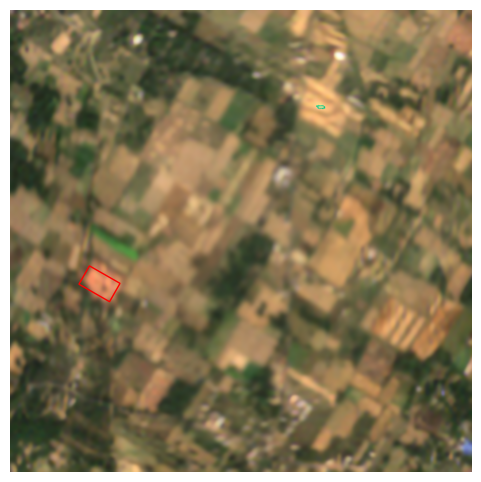

26.95,81.05.png


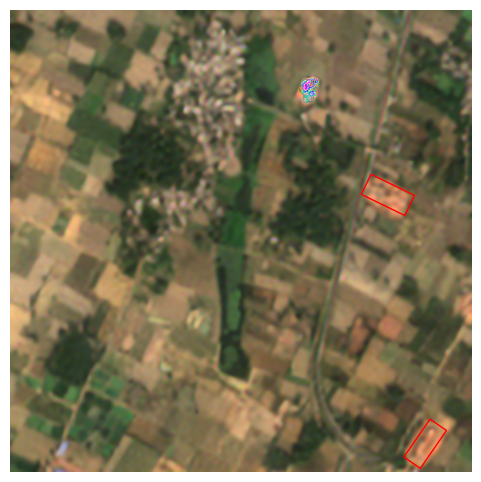

26.69,80.84.png


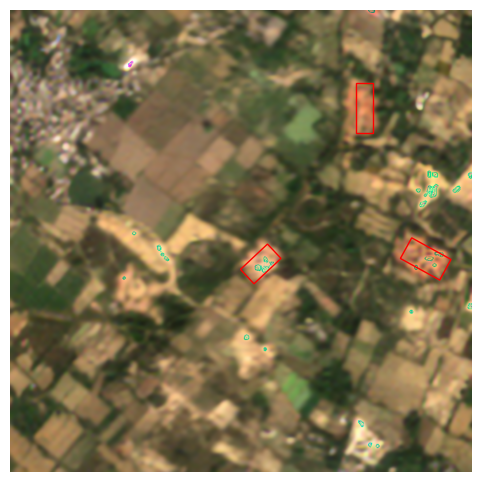

26.90,81.20.png


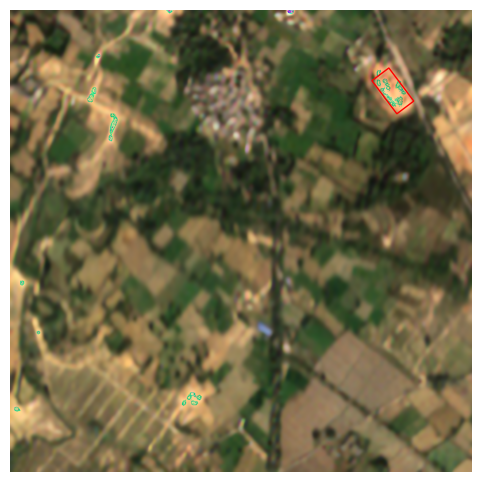

26.76,81.24.png


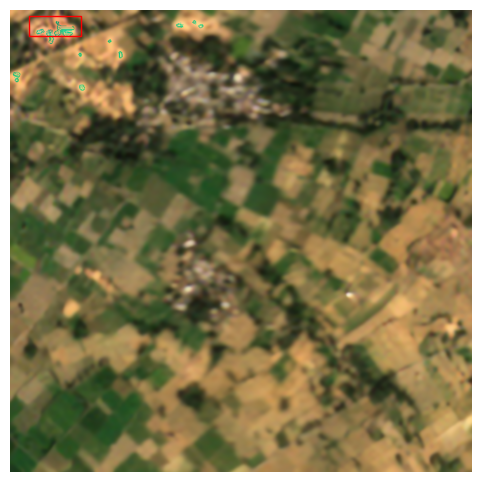

26.76,81.22.png


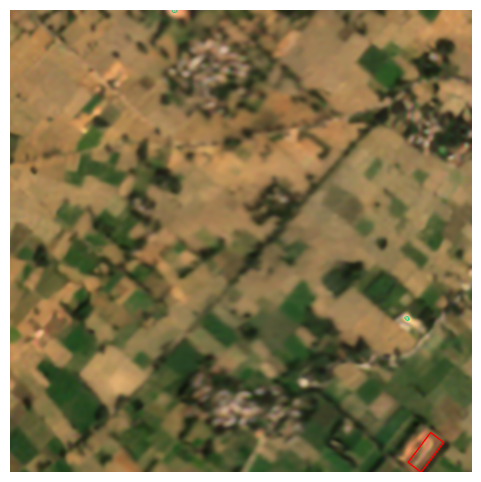

26.76,81.23.png


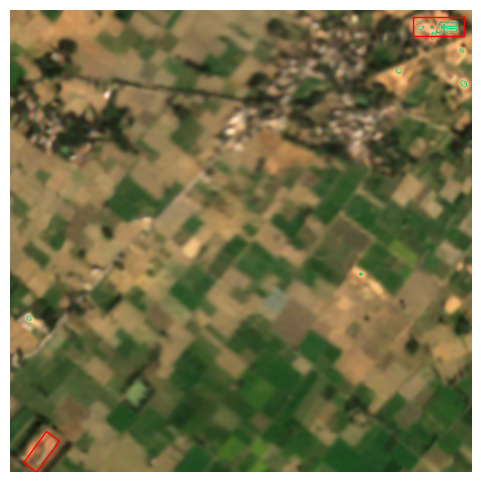

27.10,81.19.png


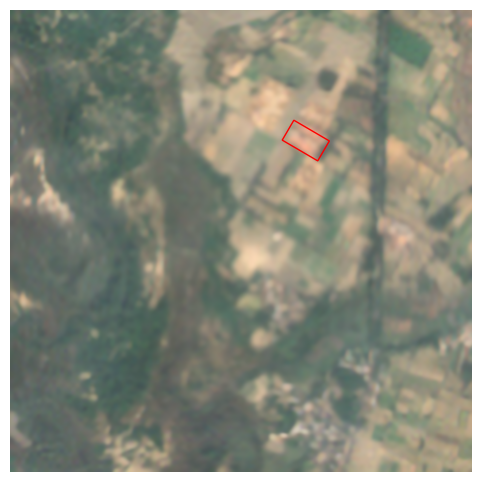

In [19]:
for file_name in first_ten_images:
    print(file_name)
    display_image(file_name, directory_path_sentinel_obb, directory_path_labels=directory_path_labels_obb, save_path=None,sentinel=False, obb=True)